# Plot estimated filters in linear-nonlinear model fits to Baker neural data

Use fits where filters are constrained to be two exponentials.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from disp import set_plot

cc = np.concatenate

FPS = 8.5
DT = 1/FPS
NT = 300
T = DT*np.arange(NT) - 10

IT_STIM = (85, 170)
IDUR_STIM = IT_STIM[1] - IT_STIM[0]
DUR_STIM = DT*IDUR_STIM

T_COLS = [f'IT_{it}' for it in range(NT)]

IDUR_H = 85
T_H = np.arange(0, IDUR_H)*DT
H_T_COLS = [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]

In [2]:
# load neural response data
df = pd.read_csv('data/simple/neur/baker.csv')
expt_ids = np.sort(np.unique(df['EXPT_ID']))

df

,EXPT_ID,STIM,LINE,FLY,ROI,ROI_USED,IT_0,IT_1,IT_2,IT_3,...,IT_290,IT_291,IT_292,IT_293,IT_294,IT_295,IT_296,IT_297,IT_298,IT_299
0,0,S,R70G01,0,somas,False,-0.286139,-0.251529,-0.214845,-0.085881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,P,R70G01,0,somas,False,-0.090690,-0.071585,0.027546,-0.089212,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,S,R70G01,1,somas,False,-0.074163,-0.052967,-0.226459,-0.086673,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,P,R70G01,1,somas,False,-0.094280,-0.175828,-0.132839,-0.155376,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,S,R70G01,2,somas,False,-0.359071,-0.296972,-0.283760,-0.206650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,221,P,vPN1_split,0,somas,False,0.308926,0.069519,-0.028961,-0.103122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444,222,S,vPN1_split,1,somas,False,0.268154,0.517779,0.526319,0.353496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
445,222,P,vPN1_split,1,somas,False,0.563747,0.506288,0.271983,0.002747,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
446,223,S,vPN1_split,2,somas,False,0.023391,0.023677,0.009701,0.006185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df_param_ln2e = pd.read_csv('data/simple/neur/baker_ln2e_fit_param.csv')
df_pred_ln2e = pd.read_csv('data/simple/neur/baker_ln2e_fit_pred.csv')

In [4]:
df_param_ln2e

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_0,...,X_S_1,TAU_S_1,X_P_0,TAU_P_0,X_P_1,TAU_P_1,R_MIN,R_MAX,Z_0,BETA
0,0,R70G01,0,somas,False,0.117560,1,85,-0.000000,NaN,...,-0.154191,30.180363,-3.961294,26.948504,3.787005,30.630950,-3.381946,7.398916,0.671628,0.583010
1,1,R70G01,1,somas,False,0.158858,1,85,0.117647,NaN,...,-0.013565,21.753526,-4.049267,20.172798,3.902730,22.053586,-3.706495,8.188287,0.987402,0.400469
2,2,R70G01,2,somas,False,0.191264,1,85,0.235294,NaN,...,-0.764675,6.530992,-225.405985,50.045630,225.147387,50.422539,-3.857243,10.035773,1.907539,0.252120
3,3,R70G01,3,somas,False,0.442547,1,85,0.235294,NaN,...,-0.696203,15.725203,-1.791570,0.387985,-0.266678,12.185476,-3.277827,9.984575,5.376108,0.105360
4,4,R70G01,4,somas,False,0.179375,1,85,0.117647,NaN,...,-0.374162,55.459681,-0.545149,7.009295,0.083337,55.496544,-3.774448,8.738981,1.878088,0.225724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.273983,1,85,-0.000000,NaN,...,0.008059,1440.994266,1.755510,1.389889,0.043692,1440.994267,-1.315365,4.037645,1.577971,0.348053
220,220,VT34811,0,ascending projection,False,0.076723,1,85,-0.000000,NaN,...,-0.004666,27.642668,4.725851,1.098195,-0.046660,27.626202,-6.206005,6.536448,0.375284,0.062548
221,221,vPN1_split,0,somas,False,0.379871,1,85,-0.000000,NaN,...,0.264978,7.350327,0.963394,0.497237,0.090109,5.033177,-8.823967,3.274269,-2.007860,0.248950
222,222,vPN1_split,1,somas,False,1.166182,1,85,0.235294,NaN,...,-142.865338,91.318485,8.985745,48.286775,-8.506011,90.451418,-10.065268,2.044586,-4.322561,0.180781


In [5]:
x_s_0s = np.array(df_param_ln2e['X_S_0'])
tau_s_0s = np.array(df_param_ln2e['TAU_S_0'])
x_s_1s = np.array(df_param_ln2e['X_S_1'])
tau_s_1s = np.array(df_param_ln2e['TAU_S_1'])

x_p_0s = np.array(df_param_ln2e['X_P_0'])
tau_p_0s = np.array(df_param_ln2e['TAU_P_0'])
x_p_1s = np.array(df_param_ln2e['X_P_1'])
tau_p_1s = np.array(df_param_ln2e['TAU_P_1'])

r_mins = np.array(df_param_ln2e['R_MIN'])
r_maxs = np.array(df_param_ln2e['R_MAX'])
z_0s = np.array(df_param_ln2e['Z_0'])
betas = np.array(df_param_ln2e['BETA'])

In [6]:
# reconstruct filters
h_ss = []
h_ps = []

for expt_id, x_s_0, tau_s_0, x_s_1, tau_s_1, x_p_0, tau_p_0, x_p_1, tau_p_1 in \
        zip(expt_ids, x_s_0s, tau_s_0s, x_s_1s, tau_s_1s, x_p_0s, tau_p_0s, x_p_1s, tau_p_1s):
    
    h_s = x_s_0*np.exp(-T_H/tau_s_0) + x_s_1*np.exp(-T_H/tau_s_1)
    h_p = x_p_0*np.exp(-T_H/tau_p_0) + x_p_1*np.exp(-T_H/tau_p_1)
    
    h_ss.append(h_s)
    h_ps.append(h_p)

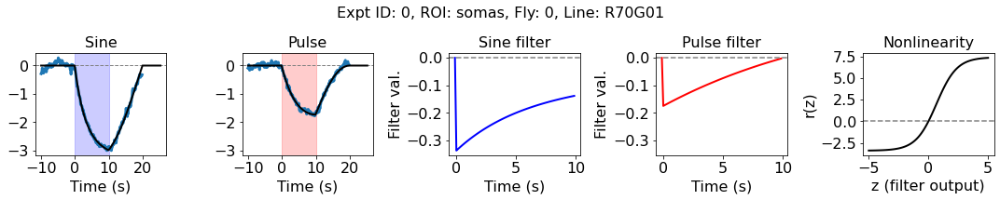

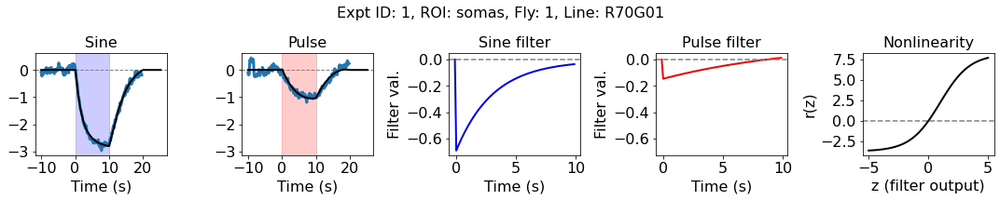

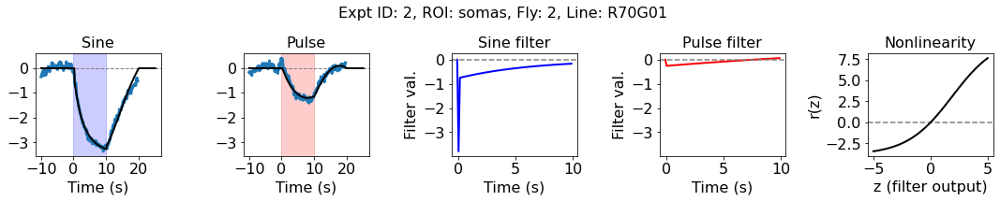

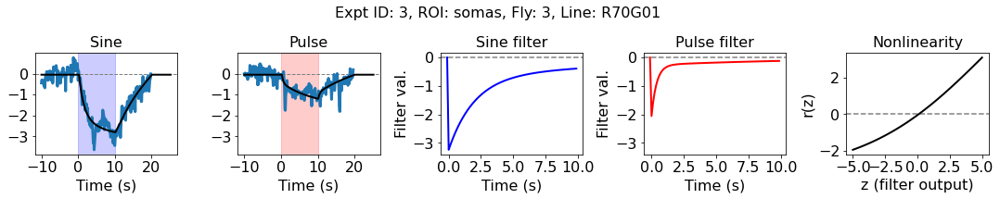

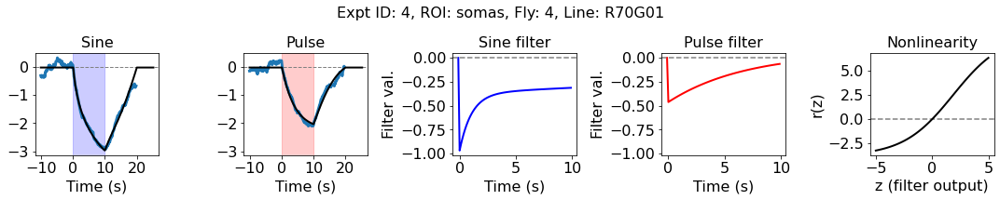

...

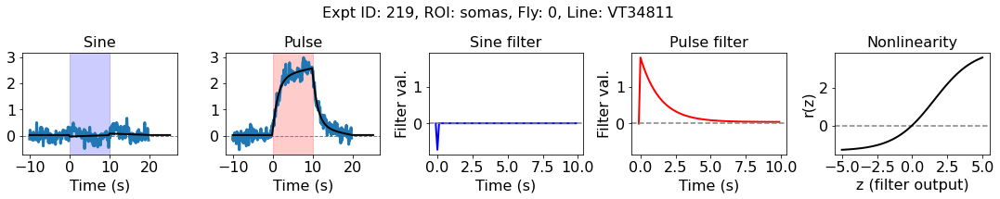

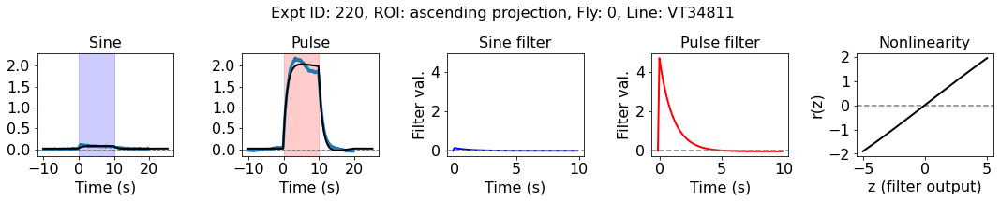

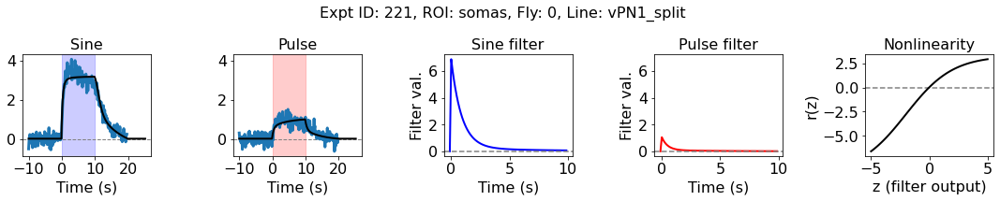

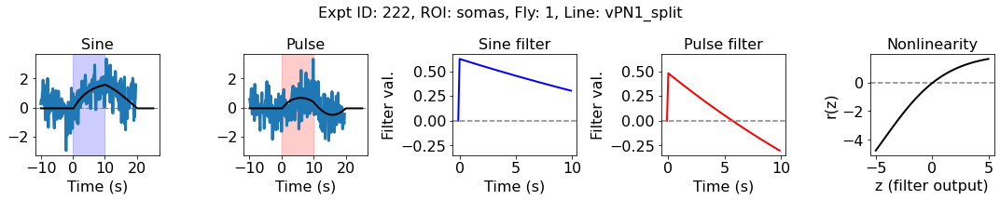

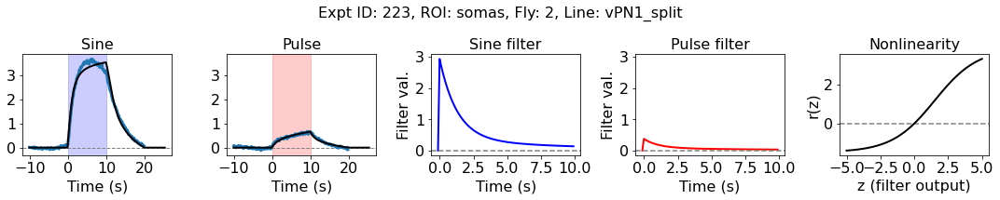

In [7]:
# expt_ids_plot = [0, 2, 77, 78, 79, 80, 81, 82, 104]
expt_ids_plot = np.arange(len(df_param_ln2e))
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

znl = np.linspace(-5, 5, 101)

for cexpt, expt_id in enumerate(expt_ids_plot):
    fig = plt.figure(figsize=(15, 3), tight_layout=True)
    axs = [fig.add_subplot(1, 5, 1)]
    axs.append(fig.add_subplot(1, 5, 2, sharey=axs[0]))
    axs.append(fig.add_subplot(1, 5, 3))
    axs.append(fig.add_subplot(1, 5, 4, sharey=axs[2]))
    axs.append(fig.add_subplot(1, 5, 5))
    
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(0, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(0, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p, lw=3)
    
    # prediction
    ## sine response
    row_s = df_pred_ln2e[(df_pred_ln2e['EXPT_ID'] == expt_id) & (df_pred_ln2e['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_ln2e[(df_pred_ln2e['EXPT_ID'] == expt_id) & (df_pred_ln2e['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p, lw=2, c='k')
    
    for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
        ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
        ax.set_title(stim)
        ax.set_xlabel('Time (s)')
        set_plot(ax, x_label='Time (s)', title=stim, font_size=16)
        
    # filters
    axs[2].plot(cc([[-DT], T_H]), cc([[0], h_ss[expt_id]]), lw=2, c='b')
    axs[2].set_title('Sine filter')
        
    axs[3].plot(cc([[-DT], T_H]), cc([[0], h_ps[expt_id]]), lw=2, c='r')
    axs[3].set_title('Pulse filter')
    
    for ax in axs[2:]:
        ax.axhline(0, color='gray', ls='--')
        set_plot(ax, x_label='Time (s)', y_label='Filter val.', font_size=16)
    
    # nonlinearity
    r_min = r_mins[expt_id]
    r_max = r_maxs[expt_id]
    z_0 = z_0s[expt_id]
    beta = betas[expt_id]
    
    axs[4].plot(znl, r_min + (r_max - r_min)*(np.tanh(beta*(znl - z_0)) + 1)/2, lw=2, c='k')
    set_plot(axs[4], x_label='z (filter output)', y_label='r(z)', title='Nonlinearity', font_size=16)
    
    fig.suptitle(f'Expt ID: {expt_id}, ROI: {roi}, Fly: {fly}, Line: {line}', fontsize=16)